In [1]:
import pickle
import numpy as np
import pandas as pd
import math
from sklearn import metrics
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, normalize
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import sys
import os

In [2]:
sys.path.append(os.path.abspath(os.path.join('../script')))

In [4]:
from selector1 import *
from visualizer2 import *
from outlier import Outlier

In [5]:
import warnings
warnings.filterwarnings('ignore')

In [6]:
pd.set_option('display.max_columns', 100)

In [8]:
df = pd.read_csv("../data/cleaned_data.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146887 entries, 0 to 146886
Data columns (total 58 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   Unnamed: 0                        146887 non-null  int64  
 1   Unnamed: 0.1                      146887 non-null  int64  
 2   Bearer Id                         146887 non-null  float64
 3   Start                             146887 non-null  object 
 4   Start ms                          146887 non-null  float64
 5   End                               146887 non-null  object 
 6   End ms                            146887 non-null  float64
 7   Dur. (ms)                         146887 non-null  float64
 8   IMSI                              146887 non-null  float64
 9   MSISDN/Number                     146887 non-null  float64
 10  IMEI                              146887 non-null  float64
 11  Last Location Name                146887 non-null  o

### User Experience Metrics

In [9]:
user_experience_df = df[[
    'MSISDN/Number',
    'Avg RTT DL (ms)',
    'Avg RTT UL (ms)',
    'Avg Bearer TP DL (kbps)',
    'Avg Bearer TP UL (kbps)',
    'TCP DL Retrans. Vol (Bytes)',
    'TCP UL Retrans. Vol (Bytes)',
    'Handset Type']]

In [10]:
# caluclate the totals
user_experience_df['Total Avg RTT (ms)'] = user_experience_df['Avg RTT DL (ms)'] + user_experience_df['Avg RTT UL (ms)']
user_experience_df['Total Avg Bearer TP (kbps)'] = user_experience_df['Avg Bearer TP DL (kbps)'] + user_experience_df['Avg Bearer TP UL (kbps)']
user_experience_df['Total TCP Retrans. Vol (Bytes)'] = user_experience_df['TCP DL Retrans. Vol (Bytes)'] + user_experience_df['TCP UL Retrans. Vol (Bytes)']
user_experience_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146887 entries, 0 to 146886
Data columns (total 11 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   MSISDN/Number                   146887 non-null  float64
 1   Avg RTT DL (ms)                 146887 non-null  float64
 2   Avg RTT UL (ms)                 146887 non-null  float64
 3   Avg Bearer TP DL (kbps)         146887 non-null  float64
 4   Avg Bearer TP UL (kbps)         146887 non-null  float64
 5   TCP DL Retrans. Vol (Bytes)     146887 non-null  float64
 6   TCP UL Retrans. Vol (Bytes)     146887 non-null  float64
 7   Handset Type                    146887 non-null  object 
 8   Total Avg RTT (ms)              146887 non-null  float64
 9   Total Avg Bearer TP (kbps)      146887 non-null  float64
 10  Total TCP Retrans. Vol (Bytes)  146887 non-null  float64
dtypes: float64(10), object(1)
memory usage: 12.3+ MB


In [11]:
user_experience_df.head()

,MSISDN/Number,Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),TCP DL Retrans. Vol (Bytes),TCP UL Retrans. Vol (Bytes),Handset Type,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes)
0,3.366496e+10,42.0,5.0,23.0,44.0,19520.0,7230.0,Samsung Galaxy A5 Sm-A520F,47.0,67.0,26750.0
1,3.368185e+10,65.0,5.0,16.0,26.0,19520.0,7230.0,Samsung Galaxy J5 (Sm-J530),70.0,42.0,26750.0
2,3.373168e+10,65.0,5.0,6.0,9.0,19520.0,7230.0,Samsung Galaxy A8 (2018),70.0,15.0,26750.0
3,3.373168e+10,65.0,5.0,44.0,44.0,19520.0,7230.0,unknown,70.0,88.0,26750.0
4,3.369980e+10,65.0,5.0,6.0,9.0,19520.0,7230.0,Samsung Sm-G390F,70.0,15.0,26750.0


In [12]:
# select the necessary columns
user_experience_df = user_experience_df[['MSISDN/Number', 'Handset Type', 'Total Avg RTT (ms)',
    'Total Avg Bearer TP (kbps)', 'Total TCP Retrans. Vol (Bytes)']]
user_experience_df.head()

,MSISDN/Number,Handset Type,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes)
0,3.366496e+10,Samsung Galaxy A5 Sm-A520F,47.0,67.0,26750.0
1,3.368185e+10,Samsung Galaxy J5 (Sm-J530),70.0,42.0,26750.0
2,3.373168e+10,Samsung Galaxy A8 (2018),70.0,15.0,26750.0
3,3.373168e+10,unknown,70.0,88.0,26750.0
4,3.369980e+10,Samsung Sm-G390F,70.0,15.0,26750.0


In [14]:
# aggregating user experience metrics per user
user_experience_df1 = user_experience_df.groupby(
    'MSISDN/Number').agg({
        'Total Avg RTT (ms)': 'sum',
        'Total Avg Bearer TP (kbps)': 'sum',
        'Total TCP Retrans. Vol (Bytes)': 'sum',
        'Handset Type': [lambda x: x.mode()[0]]})
user_experience_df1.head()

,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes),Handset Type
,sum,sum,sum,<lambda>
MSISDN/Number,,,,
3.360304e+10,47046.5,7624337.0,1.424016e+09,unknown
3.360304e+10,40.0,102.0,7.488492e+06,Apple iPhone Xr (A2105)
3.360304e+10,35.0,106.0,7.824628e+06,Samsung Galaxy J3 (Sm-J330)
3.360304e+10,129.0,1529.0,1.293200e+04,Apple iPhone 6 Plus (A1524)
3.360304e+10,104.5,52836.0,2.772426e+06,Samsung Galaxy S8 (Sm-G950F)


In [15]:
user_experience_df = pd.DataFrame(columns=[
    "Total Avg RTT (ms)",
    "Total Avg Bearer TP (kbps)",
    "Total TCP Retrans. Vol (Bytes)",
    "Handset Type"])

user_experience_df["Total Avg RTT (ms)"] = user_experience_df1["Total Avg RTT (ms)"]['sum']
user_experience_df["Total Avg Bearer TP (kbps)"] = user_experience_df1["Total Avg Bearer TP (kbps)"]['sum']
user_experience_df["Total TCP Retrans. Vol (Bytes)"] = user_experience_df1["Total TCP Retrans. Vol (Bytes)"]['sum']
user_experience_df["Handset Type"] = user_experience_df1["Handset Type"]['<lambda>']
user_experience_df.head()

,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes),Handset Type
MSISDN/Number,,,,
3.360304e+10,47046.5,7624337.0,1.424016e+09,unknown
3.360304e+10,40.0,102.0,7.488492e+06,Apple iPhone Xr (A2105)
3.360304e+10,35.0,106.0,7.824628e+06,Samsung Galaxy J3 (Sm-J330)
3.360304e+10,129.0,1529.0,1.293200e+04,Apple iPhone 6 Plus (A1524)
3.360304e+10,104.5,52836.0,2.772426e+06,Samsung Galaxy S8 (Sm-G950F)


### Top 10 values of the experience metrics

In [16]:
# top 10 rtt values in the dataset

rtt = user_experience_df.sort_values('Total Avg RTT (ms)', ascending=False)
top_10 = rtt.head(10)['Total Avg RTT (ms)']
bottom_10 = rtt.tail(10)['Total Avg RTT (ms)']
most_10 = user_experience_df['Total Avg RTT (ms)'].value_counts().head(10)

In [17]:
plotly_multi_hist([top_10, bottom_10, most_10], 1, 3,
    "RTT values in the dataset", ['Top 10', 'Bottom 10', 'Most 10'])

In [18]:
# top 10 tp values in the dataset

tp = user_experience_df.sort_values('Total Avg Bearer TP (kbps)', ascending=False)
top_10 = tp.head(10)['Total Avg Bearer TP (kbps)']
bottom_10 = tp.tail(10)['Total Avg Bearer TP (kbps)']
most_10 = user_experience_df['Total Avg Bearer TP (kbps)'].value_counts().head(10)

In [19]:
plotly_multi_hist([top_10, bottom_10, most_10], 1, 3,
    "TP values in the dataset", ['Top 10', 'Bottom 10', 'Most 10'])

In [20]:
# top 10 tcp values in the dataset

tcp = user_experience_df.sort_values('Total TCP Retrans. Vol (Bytes)', ascending=False)
top_10 = tcp.head(10)['Total TCP Retrans. Vol (Bytes)']
bottom_10 = tcp.tail(10)['Total TCP Retrans. Vol (Bytes)']
most_10 = user_experience_df['Total TCP Retrans. Vol (Bytes)'].value_counts().head(10)

In [21]:
plotly_multi_hist([top_10, bottom_10, most_10], 1, 3,
    "TCP values in the dataset", ['Top 10', 'Bottom 10', 'Most 10'])

### Average values of experience metrics per handset type

In [22]:
handset_type_df = user_experience_df.groupby('Handset Type').mean()
handset_type_df.head()

,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes)
Handset Type,,,
A-Link Telecom I. Cubot Note Plus,129.0,6699.0,616213.0
A-Link Telecom I. Cubot Note S,125.0,8937.0,7725274.5
A-Link Telecom I. Cubot Nova,44.0,50545.5,137170.0
A-Link Telecom I. Cubot Power,43.0,50337.5,8041.0
A-Link Telecom I. Cubot X18 Plus,43.5,12559.0,1346187.5


In [23]:
# sorting per tp
tp = handset_type_df.sort_values(
    'Total Avg Bearer TP (kbps)', ascending=False)
tp.head()

,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes)
Handset Type,,,
Huawei Par-Lx9,213.500000,127454.00000,2.896635e+06
Neel Enterprise Kolor Crosscalltrekker-X2,180.000000,105530.00000,1.549202e+07
New-Bund Technol. Thor,93.000000,103871.50000,5.758701e+06
Spa Condor Elect. Allure M2,90.000000,102025.00000,8.901600e+04
Huawei B528S-23A,359.405296,96739.99071,1.292468e+07


In [24]:
# sorting per tcp
tcp = handset_type_df.sort_values(
    'Total TCP Retrans. Vol (Bytes)', ascending=False)
tcp.head()

,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes)
Handset Type,,,
Sierra Wireless Usb305,245.000000,31440.00000,1.564926e+07
Neel Enterprise Kolor Crosscalltrekker-X2,180.000000,105530.00000,1.549202e+07
Huawei Me909S-120,208.000000,1548.50000,1.473096e+07
Huawei B528S-23A,359.405296,96739.99071,1.292468e+07
Sfr Star Trail 5 By Sfr,265.000000,9718.00000,9.822624e+06


### Outliers

In [25]:
user_experience_df = user_experience_df[["Total Avg RTT (ms)",
    "Total Avg Bearer TP (kbps)",
    "Total TCP Retrans. Vol (Bytes)"]]

In [27]:
outlier = Outlier(user_experience_df)

<AxesSubplot:>

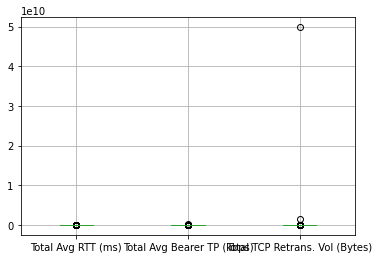

In [28]:
user_experience_df.boxplot()

In [30]:
outlier.getOverview(["Total Avg RTT (ms)",
    "Total Avg Bearer TP (kbps)",
    "Total TCP Retrans. Vol (Bytes)"])

Name of columns,Total Avg Bearer TP (kbps),Total Avg RTT (ms),Total TCP Retrans. Vol (Bytes)
Min,0.0,0.0,51.0
Q1,98.0,39.0,82448.0
Median,314.0,64.0,681145.5
Q3,24827.75,118.0,4581232.5
Max,295661911.0,1473934.5,49826254049.5
IQR,24729.75,79.0,4498784.5
Lower fence,-36996.625,-79.5,-6665728.75
Upper fence,61922.375,236.5,11329409.25
Skew,297.219428,297.362075,297.269768
Number_of_outliers,4146,3782,3033


In [31]:
outlier .replace_outliers_with_fences(["Total Avg RTT (ms)",
    "Total Avg Bearer TP (kbps)",
    "Total TCP Retrans. Vol (Bytes)"])

In [32]:
outlier .getOverview(["Total Avg RTT (ms)",
    "Total Avg Bearer TP (kbps)",
    "Total TCP Retrans. Vol (Bytes)"])

Name of columns,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes)
Min,0.0,0.0,51.0
Q1,39.0,98.0,82448.0
Median,64.0,314.0,681145.5
Q3,118.0,24827.75,4581232.5
Max,236.5,61922.375,11329409.25
IQR,79.0,24729.75,4498784.5
Lower fence,-79.5,-36996.625,-6665728.75
Upper fence,236.5,61922.375,11329409.25
Skew,1.210861,1.218611,1.163685
Number_of_outliers,0,0,0


<AxesSubplot:>

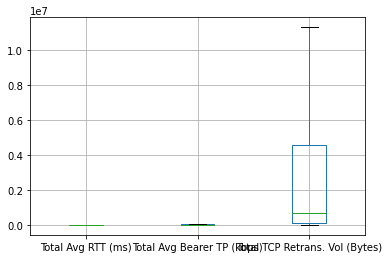

In [33]:
user_experience_df.boxplot()

### K-means Clustering

In [34]:
# scale data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(user_experience_df)
scaled_data

array([[ 2.79781458,  2.35248163,  2.5915413 ],
       [-0.76684502, -0.67531817,  1.45236534],
       [-0.85754883, -0.67512226,  1.55205984],
       ...,
       [-0.96639339, -0.27909119, -0.76300239],
       [-1.11151948, -0.6795792 , -0.75351301],
       [ 2.79781458,  2.35248163,  2.5915413 ]])

In [35]:
normalized_data = normalize(scaled_data)
normalized_data

array([[ 0.62439363,  0.52500782,  0.57835922],
       [-0.43183037, -0.38028922,  0.81786468],
       [-0.45196353, -0.35581722,  0.81799943],
       ...,
       [-0.76544223, -0.22105716, -0.60434421],
       [-0.73854132, -0.45154163, -0.50066643],
       [ 0.62439363,  0.52500782,  0.57835922]])

In [36]:
kmeans = KMeans(n_clusters=3, random_state=1).fit(normalized_data)
kmeans.labels_

array([1, 2, 2, ..., 0, 0, 1])

In [37]:
user_experience_df.insert(0, 'cluster', kmeans.labels_)
user_experience_df

,cluster,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes)
MSISDN/Number,,,,
3.360304e+10,1,236.5,61922.375,11329409.25
3.360304e+10,2,40.0,102.000,7488492.00
3.360304e+10,2,35.0,106.000,7824628.25
3.360304e+10,0,129.0,1529.000,12932.00
3.360304e+10,1,104.5,52836.000,2772426.00
...,...,...,...,...
3.370000e+10,0,62.5,15.000,1328130.00
3.370000e+10,0,132.0,4475.000,895516.00
3.370000e+10,0,29.0,8192.000,19019.00


In [38]:
user_experience_df['cluster'].value_counts()

0    45294
1    27629
2    15831
Name: cluster, dtype: int64

In [39]:
fig = px.scatter(user_experience_df, x='Total TCP Retrans. Vol (Bytes)', y='Total Avg Bearer TP (kbps)',
                 color='cluster', size='Total Avg RTT (ms)')
fig.show()

In [40]:
cluster0 = user_experience_df[user_experience_df["cluster"]==0]
cluster0[["Total Avg RTT (ms)",
    "Total Avg Bearer TP (kbps)",
    "Total TCP Retrans. Vol (Bytes)"]].describe()

,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes)
count,45294.000000,45294.000000,4.529400e+04
mean,57.555526,2009.838025,4.618197e+05
std,32.271576,4838.432009,7.146360e+05
min,0.000000,0.000000,5.100000e+01
25%,33.000000,86.000000,2.455500e+04
50%,48.000000,112.000000,1.300185e+05
75%,72.000000,545.000000,5.422443e+05
max,155.000000,31263.000000,3.710590e+06


In [41]:
cluster1 = user_experience_df[user_experience_df["cluster"]==1]
cluster1[["Total Avg RTT (ms)",
    "Total Avg Bearer TP (kbps)",
    "Total TCP Retrans. Vol (Bytes)"]].describe()

,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes)
count,27629.000000,27629.000000,2.762900e+04
mean,126.557765,39498.746001,3.506524e+06
std,61.615358,17813.516008,3.705573e+06
min,19.000000,2.000000,9.700000e+01
25%,76.000000,26735.000000,3.934140e+05
50%,120.000000,43670.000000,1.862953e+06
75%,163.500000,52765.000000,6.884162e+06
max,236.500000,61922.375000,1.132941e+07


In [42]:
cluster2 = user_experience_df[user_experience_df["cluster"]==2]
cluster2[["Total Avg RTT (ms)",
    "Total Avg Bearer TP (kbps)",
    "Total TCP Retrans. Vol (Bytes)"]].describe()

,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes)
count,15831.000000,15831.000000,1.583100e+04
mean,75.698219,3188.768808,7.088369e+06
std,47.086492,7316.359829,1.910323e+06
min,0.000000,0.000000,2.268462e+06
25%,38.000000,91.000000,5.940097e+06
50%,62.000000,127.000000,7.687532e+06
75%,108.000000,761.000000,7.824628e+06
max,236.500000,52878.000000,1.132941e+07


### Saving Data

In [43]:
# save the dataframe
user_experience_df.to_csv('../data/user_experience_data.csv')

In [44]:
# save the clustering model
with open("../models/user_experience.pkl", "wb") as f:
    pickle.dump(kmeans, f)